Plots to check that everything worked...

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import os
import glob
from astropy.table import Table
from astropy.io import ascii
import astropy.units as u
import astropy.constants as const
from matplotlib.gridspec import GridSpec
from astropy.units import cds
cds.enable()

#matplotlib set up
%matplotlib inline
from matplotlib import rcParams
rcParams["figure.figsize"] = (14, 5)
rcParams["font.size"] = 20


In [16]:
path = '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/'

In [17]:
all_seds = glob.glob('{}*/components_v1/*multi*v10*.fits'.format(path))
all_seds

['/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/2MASS-J23062928-0502285/components_v1/hlsp_muscles_multi_multi_trappist-1_broadband_v10_adapt-const-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/2MASS-J23062928-0502285/components_v1/hlsp_muscles_multi_multi_trappist-1_broadband_v10_adapt-var-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/2MASS-J23062928-0502285/components_v1/hlsp_muscles_multi_multi_trappist-1_broadband_v10_const-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/2MASS-J23062928-0502285/components_v1/hlsp_muscles_multi_multi_trappist-1_broadband_v10_var-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/GJ1132/components_v1/hlsp_muscles_multi_multi_gj1132_broadband_v10_adapt-const-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/GJ1132/components_v1/hlsp_muscles_multi_multi_gj1132_broadband_v10_adapt-var-res-sed.fits',
 '/media/david/2tb_ext_hd/hddata/mega_muscles/hlsp/GJ1132/compon

In [18]:
names = fits.getdata(all_seds[0], 1).names

In [19]:
# print(len(names))

In [20]:
# done = os.listdir('plots/diagnosis_plots/')
# done

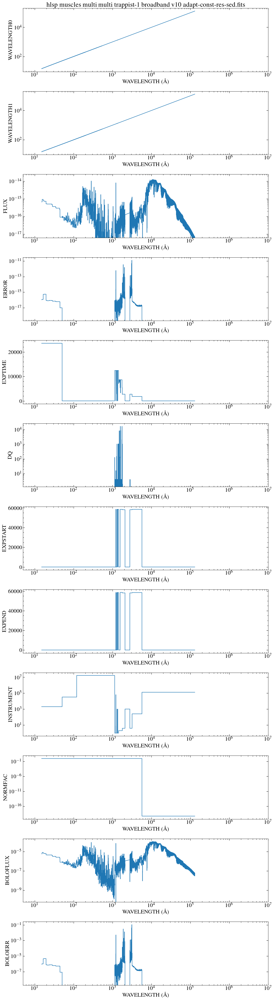

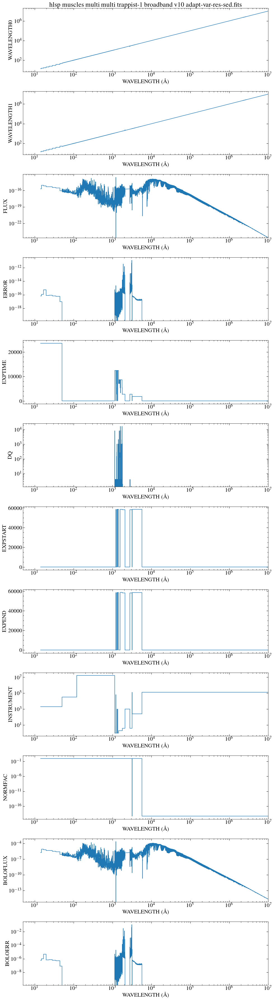

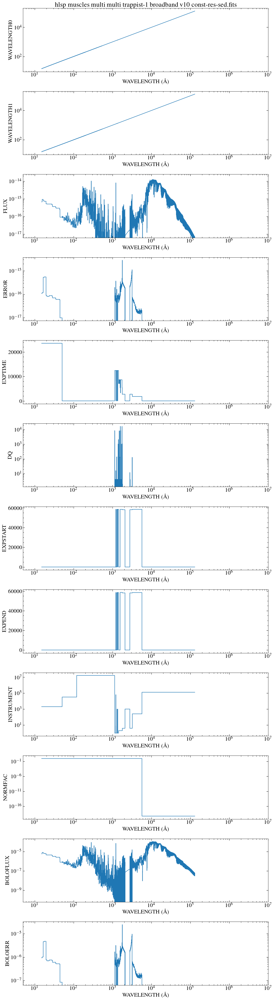

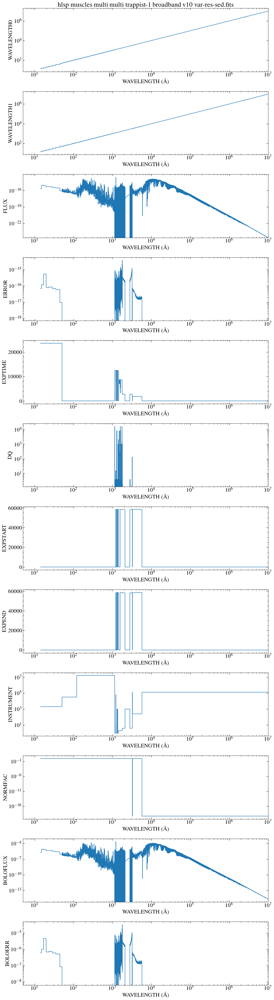

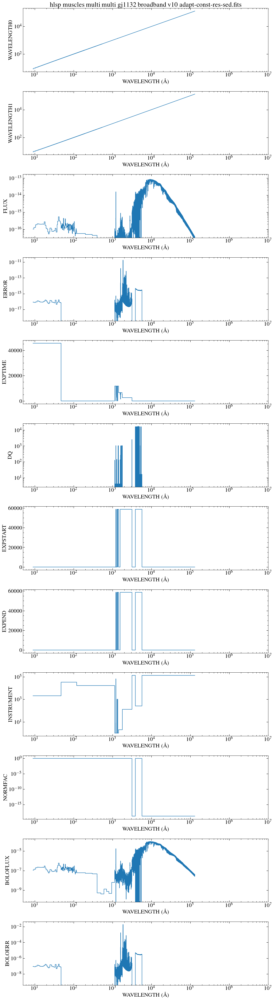

...

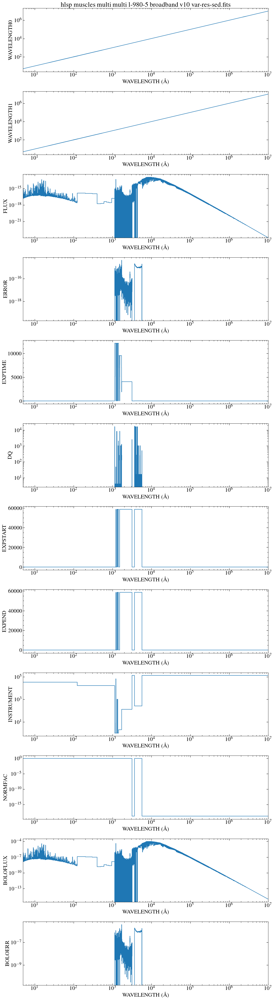

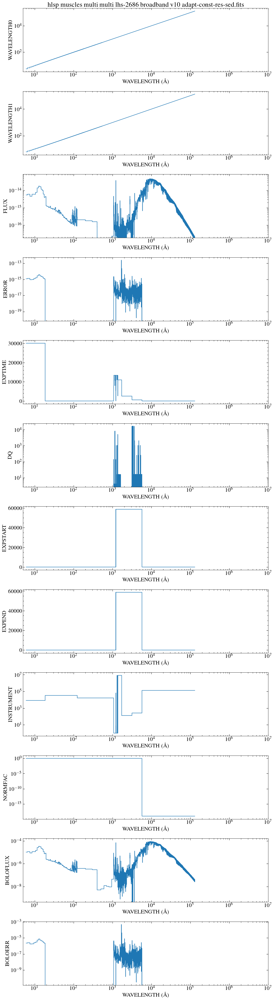

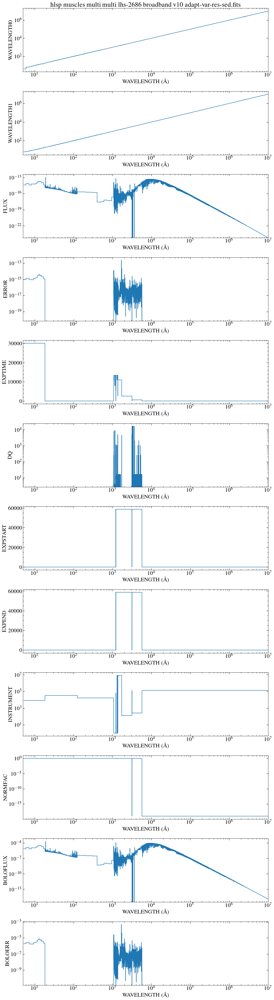

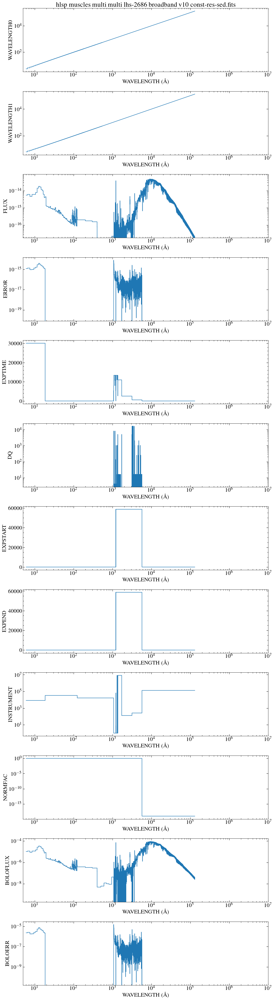

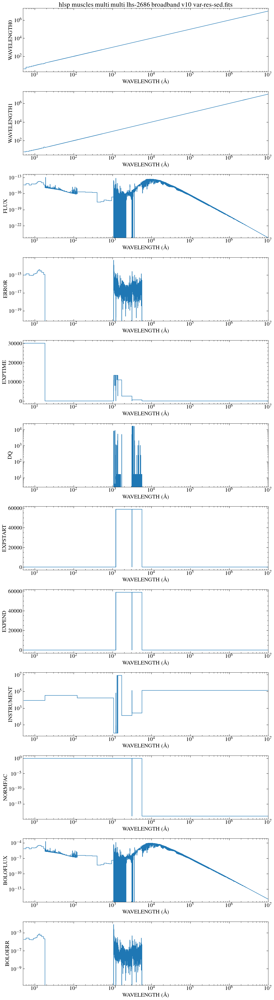

In [21]:
for sed in all_seds:
    plt.figure(figsize=(14, 50))
    filename = os.path.split(sed)[1]
#     if '{}_check.pdf'.format(filename[:-5]) not in done:
    data = fits.getdata(sed, 1)
    for i, name in enumerate(names[1:]):
        plt.subplot(12, 1, i+1)
        if i == 0:
             plt.title(filename.replace('_', ' '))
#              plt.title(filename)
        plt.step(data['WAVELENGTH'], data[name], where='mid')
        plt.xscale('log')
        if name not in ['EXPTIME', 'EXPSTART', 'EXPEND']:
            plt.yscale('log')
        if name == 'FLUX':
            plt.ylim(data[name][-1])
#         if i == len(names)-2:
        plt.xlabel('WAVELENGTH (\AA)')
        plt.ylabel(name)
        plt.xlim(5, 1e7)

    plt.tight_layout()
    plt.savefig('plots/diagnosis_plots/{}_check.pdf'.format(filename[:-5]))
    plt.show()
    plt.close()